In [ ]:
import tensorflow as tf

print("TensorFlow:", tf.__version__)
print("GPU:", tf.config.list_physical_devices('GPU'))

TensorFlow: 2.20.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
!pip install -q kagglehub scikit-learn seaborn

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mohitsingh1804/plantvillage")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'plantvillage' dataset.
Path to dataset files: /kaggle/input/plantvillage


In [ ]:
import os

for root, dirs, files in os.walk(path):
    level = root.replace(path, "").count(os.sep)
    indent = "  " * level
    print(f"{indent}{os.path.basename(root)}/")

    if level >= 2:
        continue

    for file in files[:10]:
        print(f"{indent}  {file}")

plantvillage/
  PlantVillage/
    val/
      Tomato___Late_blight/
      Tomato___healthy/
      Grape___healthy/
      Orange___Haunglongbing_(Citrus_greening)/
      Soybean___healthy/
      Squash___Powdery_mildew/
      Potato___healthy/
      Corn_(maize)___Northern_Leaf_Blight/
      Tomato___Early_blight/
      Tomato___Septoria_leaf_spot/
      Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot/
      Strawberry___Leaf_scorch/
      Peach___healthy/
      Apple___Apple_scab/
      Tomato___Tomato_Yellow_Leaf_Curl_Virus/
      Tomato___Bacterial_spot/
      Apple___Black_rot/
      Blueberry___healthy/
      Cherry_(including_sour)___Powdery_mildew/
      Peach___Bacterial_spot/
      Apple___Cedar_apple_rust/
      Tomato___Target_Spot/
      Pepper,_bell___healthy/
      Grape___Leaf_blight_(Isariopsis_Leaf_Spot)/
      Potato___Late_blight/
      Tomato___Tomato_mosaic_virus/
      Strawberry___healthy/
      Apple___healthy/
      Grape___Black_rot/
      Potato___Early_blig

In [ ]:
print("Dataset path:", path)
print("Contents:", os.listdir(path))

Dataset path: /kaggle/input/plantvillage
Contents: ['PlantVillage']


In [ ]:
from pathlib import Path

dataset_path = Path(path)

image_extensions = {".jpg", ".jpeg", ".png", ".JPG", ".JPEG", ".PNG"}

image_files = [
    p for p in dataset_path.rglob("*")
    if p.is_file() and p.suffix in image_extensions
]

print("Total images found:", len(image_files))

print("\nFirst 10 images:")
for img in image_files[:10]:
    print(img)

Total images found: 54305

First 10 images:
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/781e93a9-2059-42de-8075-658033a6abf7___RS_Late.B 6075.JPG
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/283ff0be-6e5e-4b4e-bf21-639780b77ffc___GHLB2 Leaf 8636.JPG
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/0db85707-41f9-42df-ba3b-842d14f00a68___GHLB2 Leaf 8909.JPG
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/078a999d-6e6f-427e-a1e6-80b4d2df2bae___GHLB2 Leaf 9029.JPG
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/3dcee9ed-43bb-45a9-8cff-641b3dd62179___RS_Late.B 5324.JPG
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/4eca7d70-60ff-41cc-8884-e4844f23abeb___GHLB2 Leaf 8641.JPG
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/532b2c20-d17b-4b3e-a69e-54a6e5343014___GHLB2 Leaf 9004.JPG
/kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/418ae33c-

In [ ]:
from collections import Counter

class_names = [
    img.parent.name
    for img in image_files
]

class_counts = Counter(class_names)

print("Number of classes:", len(class_counts))

for cls, count in sorted(class_counts.items()):
    print(f"{cls}: {count}")

Number of classes: 38
Apple___Apple_scab: 630
Apple___Black_rot: 621
Apple___Cedar_apple_rust: 275
Apple___healthy: 1645
Blueberry___healthy: 1502
Cherry_(including_sour)___Powdery_mildew: 1052
Cherry_(including_sour)___healthy: 854
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 513
Corn_(maize)___Common_rust_: 1192
Corn_(maize)___Northern_Leaf_Blight: 985
Corn_(maize)___healthy: 1162
Grape___Black_rot: 1180
Grape___Esca_(Black_Measles): 1383
Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1076
Grape___healthy: 423
Orange___Haunglongbing_(Citrus_greening): 5507
Peach___Bacterial_spot: 2297
Peach___healthy: 360
Pepper,_bell___Bacterial_spot: 997
Pepper,_bell___healthy: 1478
Potato___Early_blight: 1000
Potato___Late_blight: 1000
Potato___healthy: 152
Raspberry___healthy: 371
Soybean___healthy: 5090
Squash___Powdery_mildew: 1835
Strawberry___Leaf_scorch: 1109
Strawberry___healthy: 456
Tomato___Bacterial_spot: 2127
Tomato___Early_blight: 1000
Tomato___Late_blight: 1909
Tomato___Leaf_Mold:

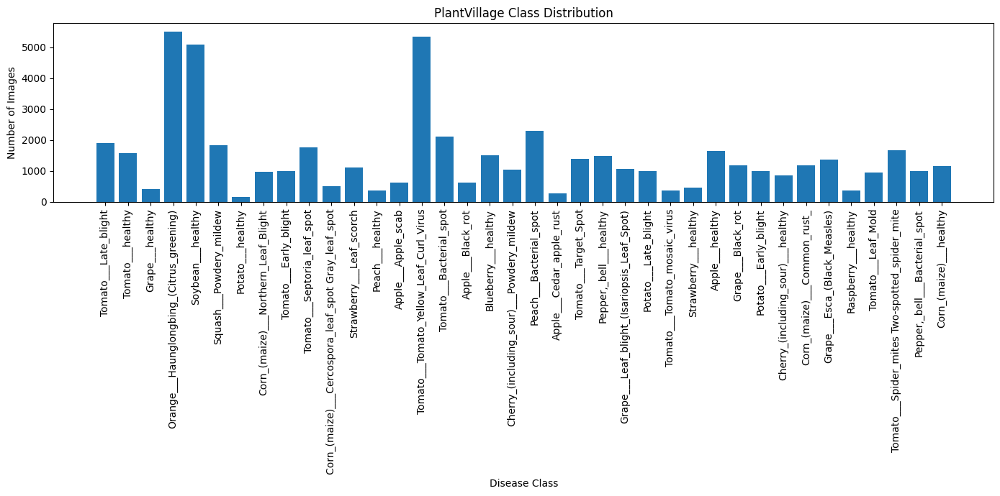

In [ ]:
import matplotlib.pyplot as plt

classes = list(class_counts.keys())
counts = list(class_counts.values())

plt.figure(figsize=(14, 7))
plt.bar(classes, counts)
plt.xticks(rotation=90)
plt.ylabel("Number of Images")
plt.xlabel("Disease Class")
plt.title("PlantVillage Class Distribution")
plt.tight_layout()
plt.show()

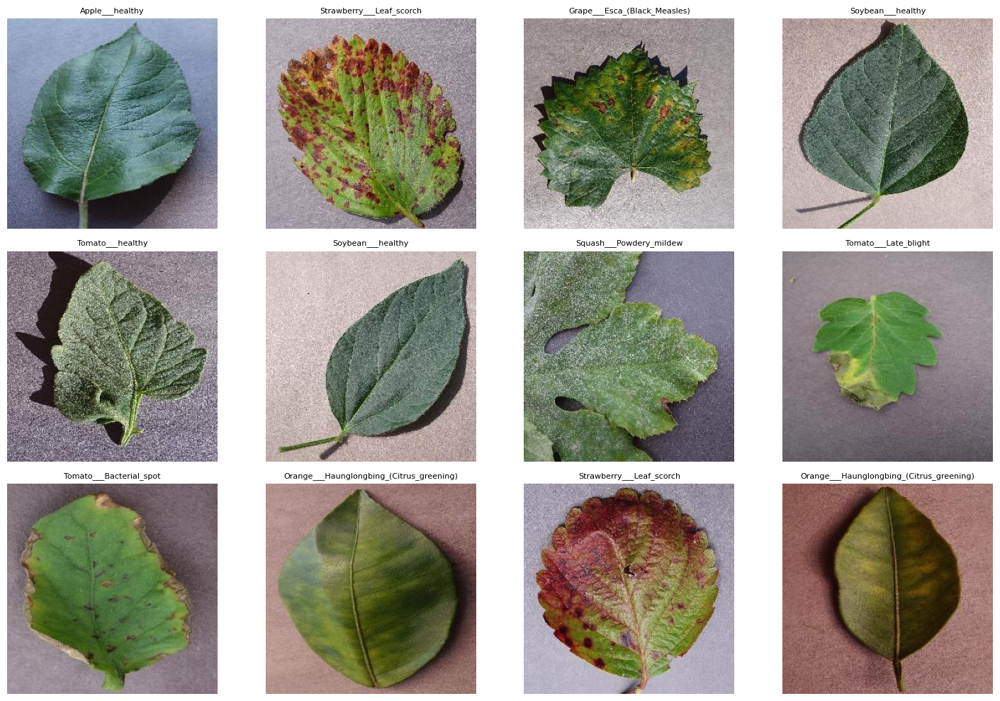

In [ ]:
import random
from PIL import Image

sample_images = random.sample(image_files, min(12, len(image_files)))

plt.figure(figsize=(15, 10))

for i, img_path in enumerate(sample_images):
    img = Image.open(img_path)

    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(img_path.parent.name, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

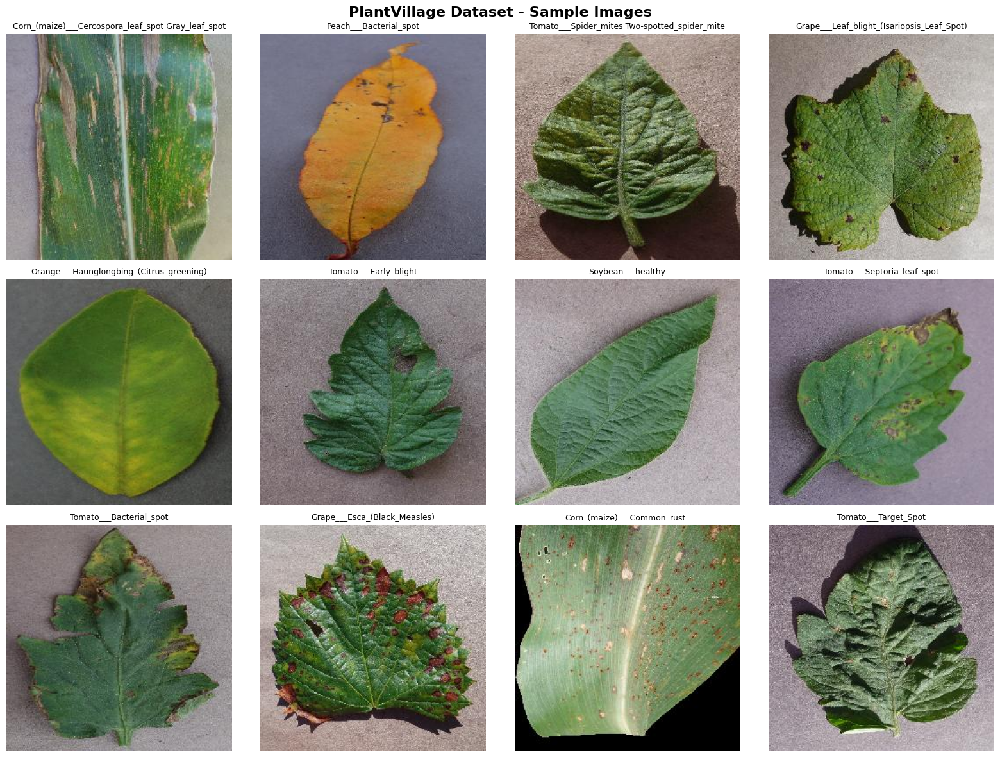

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image

# Select 12 random images
sample_images = random.sample(image_files, 12)

plt.figure(figsize=(16, 12))

for i, img_path in enumerate(sample_images):
    img = Image.open(img_path).convert("RGB")

    plt.subplot(3, 4, i + 1)
    plt.imshow(img)

    # Get class name from parent folder
    class_name = img_path.parent.name

    plt.title(class_name, fontsize=9)
    plt.axis("off")

plt.suptitle(
    "PlantVillage Dataset - Sample Images",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
print("Total images:", len(image_files))
print("Total classes:", len(class_counts))

print("\nClasses:")
for i, (cls, count) in enumerate(sorted(class_counts.items())):
    print(f"{i:02d} | {cls:<50} | {count} images")

Total images: 54305
Total classes: 38

Classes:
00 | Apple___Apple_scab                                 | 630 images
01 | Apple___Black_rot                                  | 621 images
02 | Apple___Cedar_apple_rust                           | 275 images
03 | Apple___healthy                                    | 1645 images
04 | Blueberry___healthy                                | 1502 images
05 | Cherry_(including_sour)___Powdery_mildew           | 1052 images
06 | Cherry_(including_sour)___healthy                  | 854 images
07 | Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot | 513 images
08 | Corn_(maize)___Common_rust_                        | 1192 images
09 | Corn_(maize)___Northern_Leaf_Blight                | 985 images
10 | Corn_(maize)___healthy                             | 1162 images
11 | Grape___Black_rot                                  | 1180 images
12 | Grape___Esca_(Black_Measles)                       | 1383 images
13 | Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 

In [ ]:
# Step 9: Create stratified train/validation/test split

from sklearn.model_selection import train_test_split
import pandas as pd

# Create dataframe
df = pd.DataFrame({
    "filepath": [str(p) for p in image_files],
    "class": [p.parent.name for p in image_files]
})

print("Total images:", len(df))
print("Total classes:", df["class"].nunique())

# First split:
# 70% Train
# 30% Temporary
train_df, temp_df = train_test_split(
    df,
    test_size=0.30,
    stratify=df["class"],
    random_state=42
)

# Split temporary into:
# 15% Validation
# 15% Test
val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    stratify=temp_df["class"],
    random_state=42
)

print("\nDataset split:")
print("-------------------------")
print(f"Training:   {len(train_df)} images")
print(f"Validation: {len(val_df)} images")
print(f"Testing:    {len(test_df)} images")
print("-------------------------")

print("\nPercentages:")
print(f"Training:   {len(train_df)/len(df)*100:.2f}%")
print(f"Validation: {len(val_df)/len(df)*100:.2f}%")
print(f"Testing:    {len(test_df)/len(df)*100:.2f}%")

Total images: 54305
Total classes: 38

Dataset split:
-------------------------
Training:   38013 images
Validation: 8146 images
Testing:    8146 images
-------------------------

Percentages:
Training:   70.00%
Validation: 15.00%
Testing:    15.00%


In [ ]:
# Step 10: Create class-to-index mapping

class_names = sorted(df["class"].unique())

class_to_index = {
    class_name: index
    for index, class_name in enumerate(class_names)
}

index_to_class = {
    index: class_name
    for class_name, index in class_to_index.items()
}

print("Number of classes:", len(class_names))

print("\nClass mapping:")
for index, class_name in index_to_class.items():
    print(f"{index:02d} → {class_name}")

Number of classes: 38

Class mapping:
00 → Apple___Apple_scab
01 → Apple___Black_rot
02 → Apple___Cedar_apple_rust
03 → Apple___healthy
04 → Blueberry___healthy
05 → Cherry_(including_sour)___Powdery_mildew
06 → Cherry_(including_sour)___healthy
07 → Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
08 → Corn_(maize)___Common_rust_
09 → Corn_(maize)___Northern_Leaf_Blight
10 → Corn_(maize)___healthy
11 → Grape___Black_rot
12 → Grape___Esca_(Black_Measles)
13 → Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
14 → Grape___healthy
15 → Orange___Haunglongbing_(Citrus_greening)
16 → Peach___Bacterial_spot
17 → Peach___healthy
18 → Pepper,_bell___Bacterial_spot
19 → Pepper,_bell___healthy
20 → Potato___Early_blight
21 → Potato___Late_blight
22 → Potato___healthy
23 → Raspberry___healthy
24 → Soybean___healthy
25 → Squash___Powdery_mildew
26 → Strawberry___Leaf_scorch
27 → Strawberry___healthy
28 → Tomato___Bacterial_spot
29 → Tomato___Early_blight
30 → Tomato___Late_blight
31 → Tomato___Leaf_Mol

In [ ]:
# Step 11: Add numerical labels

train_df = train_df.copy()
val_df = val_df.copy()
test_df = test_df.copy()

train_df["label"] = train_df["class"].map(class_to_index)
val_df["label"] = val_df["class"].map(class_to_index)
test_df["label"] = test_df["class"].map(class_to_index)

print(train_df.head())

                                                filepath  \
28757  /kaggle/input/plantvillage/PlantVillage/train/...   
39529  /kaggle/input/plantvillage/PlantVillage/train/...   
1259   /kaggle/input/plantvillage/PlantVillage/train/...   
52545  /kaggle/input/plantvillage/PlantVillage/val/Po...   
42610  /kaggle/input/plantvillage/PlantVillage/train/...   

                          class  label  
28757  Apple___Cedar_apple_rust      2  
39529       Raspberry___healthy     23  
1259       Tomato___Late_blight     30  
52545     Potato___Early_blight     20  
42610    Corn_(maize)___healthy     10  


In [ ]:
# Step 12: Verify class distribution across splits

print("Train classes:", train_df["class"].nunique())
print("Validation classes:", val_df["class"].nunique())
print("Test classes:", test_df["class"].nunique())

print("\nMinimum samples per class:")

print("Train:")
print(train_df["class"].value_counts().min())

print("\nValidation:")
print(val_df["class"].value_counts().min())

print("\nTest:")
print(test_df["class"].value_counts().min())

Train classes: 38
Validation classes: 38
Test classes: 38

Minimum samples per class:
Train:
106

Validation:
23

Test:
23


In [ ]:
# Step 13: Calculate class weights

from sklearn.utils.class_weight import compute_class_weight
import numpy as np

classes = np.array(sorted(train_df["label"].unique()))

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=train_df["label"].values
)

class_weights = {
    int(cls): float(weight)
    for cls, weight in zip(classes, weights)
}

print("Class weights:\n")

for cls, weight in class_weights.items():
    print(f"{cls:02d} | {index_to_class[cls]:55s} | {weight:.4f}")

Class weights:

00 | Apple___Apple_scab                                      | 2.2683
01 | Apple___Black_rot                                       | 2.2996
02 | Apple___Cedar_apple_rust                                | 5.1831
03 | Apple___healthy                                         | 0.8684
04 | Blueberry___healthy                                     | 0.9518
05 | Cherry_(including_sour)___Powdery_mildew                | 1.3592
06 | Cherry_(including_sour)___healthy                       | 1.6728
07 | Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot      | 2.7865
08 | Corn_(maize)___Common_rust_                             | 1.1995
09 | Corn_(maize)___Northern_Leaf_Blight                     | 1.4498
10 | Corn_(maize)___healthy                                  | 1.2304
11 | Grape___Black_rot                                       | 1.2111
12 | Grape___Esca_(Black_Measles)                            | 1.0334
13 | Grape___Leaf_blight_(Isariopsis_Leaf_Spot)              | 1.3285
14 |

In [ ]:
# Step 14: Create TensorFlow data pipeline

import tensorflow as tf

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

def load_image(filepath, label):
    # Read image
    image = tf.io.read_file(filepath)

    # Decode image
    image = tf.image.decode_jpeg(image, channels=3)

    # Resize to MobileNetV2 input size
    image = tf.image.resize(image, IMG_SIZE)

    # Convert to float32
    image = tf.cast(image, tf.float32)

    return image, label


# Create training dataset
train_ds = tf.data.Dataset.from_tensor_slices(
    (
        train_df["filepath"].values,
        train_df["label"].values
    )
)

train_ds = (
    train_ds
    .shuffle(10000, seed=42)
    .map(load_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)


# Validation dataset
val_ds = tf.data.Dataset.from_tensor_slices(
    (
        val_df["filepath"].values,
        val_df["label"].values
    )
)

val_ds = (
    val_ds
    .map(load_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)


# Test dataset
test_ds = tf.data.Dataset.from_tensor_slices(
    (
        test_df["filepath"].values,
        test_df["label"].values
    )
)

test_ds = (
    test_ds
    .map(load_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)


print("TensorFlow datasets created successfully.")

TensorFlow datasets created successfully.


In [ ]:
# Step 15: Check batch shape

images, labels = next(iter(train_ds))

print("Image batch shape:", images.shape)
print("Label batch shape:", labels.shape)
print("Image data type:", images.dtype)
print("Label data type:", labels.dtype)

Image batch shape: (32, 224, 224, 3)
Label batch shape: (32,)
Image data type: <dtype: 'float32'>
Label data type: <dtype: 'int64'>


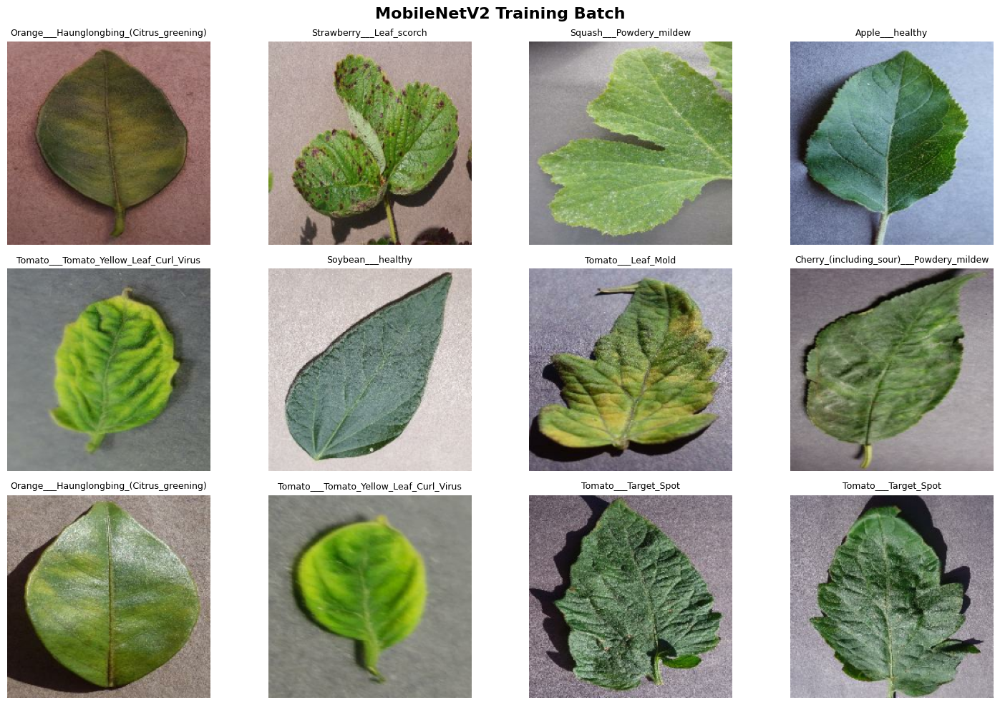

In [ ]:
# Step 16: Visualize training batch

plt.figure(figsize=(15, 10))

for i in range(12):
    plt.subplot(3, 4, i + 1)

    plt.imshow(images[i].numpy().astype("uint8"))

    label_index = int(labels[i].numpy())
    class_name = index_to_class[label_index]

    plt.title(class_name, fontsize=9)
    plt.axis("off")

plt.suptitle(
    "MobileNetV2 Training Batch",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# Step 17: MobileNetV2 preprocessing

from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

def preprocess_image(image, label):
    image = preprocess_input(image)
    return image, label


train_ds = train_ds.map(
    preprocess_image,
    num_parallel_calls=AUTOTUNE
)

val_ds = val_ds.map(
    preprocess_image,
    num_parallel_calls=AUTOTUNE
)

test_ds = test_ds.map(
    preprocess_image,
    num_parallel_calls=AUTOTUNE
)

print("MobileNetV2 preprocessing applied successfully.")

MobileNetV2 preprocessing applied successfully.


In [ ]:
# Step 18: Data augmentation

from tensorflow.keras import layers

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomTranslation(
        height_factor=0.10,
        width_factor=0.10
    ),
], name="data_augmentation")

print("Data augmentation created.")

Data augmentation created.


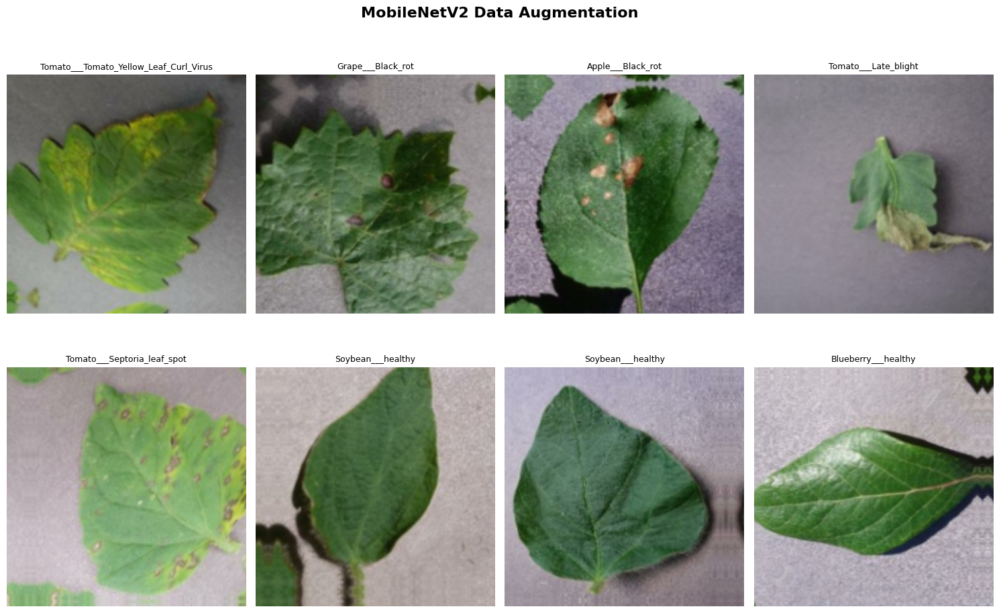

In [ ]:
# Step 19: Visualize augmented images

sample_images, sample_labels = next(iter(train_ds))

plt.figure(figsize=(15, 10))

for i in range(8):

    augmented_image = data_augmentation(
        sample_images[i:i+1],
        training=True
    )[0]

    # Convert approximately back from [-1, 1] to [0, 255]
    display_image = (augmented_image + 1.0) * 127.5
    display_image = tf.clip_by_value(
        display_image,
        0,
        255
    )

    plt.subplot(2, 4, i + 1)
    plt.imshow(display_image.numpy().astype("uint8"))

    label_index = int(sample_labels[i].numpy())
    plt.title(index_to_class[label_index], fontsize=9)
    plt.axis("off")

plt.suptitle(
    "MobileNetV2 Data Augmentation",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# Step 20: Build MobileNetV2 model

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import Model

NUM_CLASSES = len(class_names)

# Load pretrained MobileNetV2
base_model = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

# Freeze the pretrained layers initially
base_model.trainable = False

# Input
inputs = layers.Input(
    shape=(224, 224, 3),
    name="image_input"
)

# Augmentation
x = data_augmentation(inputs)

# MobileNetV2
x = base_model(
    x,
    training=False
)

# Classification head
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dropout(0.30)(x)

x = layers.Dense(
    256,
    activation="relu"
)(x)

x = layers.Dropout(0.20)(x)

outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax",
    name="disease_prediction"
)(x)

model = Model(
    inputs,
    outputs,
    name="CROPORA_MobileNetV2"
)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "CROPORA_MobileNetV2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ disease_prediction (Dense)      │ (None, 38)             │         9,766 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,595,686 (9.90 MB)

 Trainable params: 337,702 (1.29 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Step 21: Compile MobileNetV2

from tensorflow.keras.optimizers import Adam

model.compile(
    optimizer=Adam(
        learning_rate=1e-3
    ),
    loss="sparse_categorical_crossentropy",
    metrics=[
        "accuracy"
    ]
)

print("Model compiled successfully.")

Model compiled successfully.


In [ ]:
# Step 22: Training callbacks

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    ReduceLROnPlateau
)

checkpoint_path = "/content/CROPORA_disease_best.keras"

callbacks = [

    ModelCheckpoint(
        checkpoint_path,
        monitor="val_accuracy",
        save_best_only=True,
        mode="max",
        verbose=1
    ),

    EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),

    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=2,
        min_lr=1e-7,
        verbose=1
    )
]

print("Callbacks created.")

Callbacks created.


In [ ]:
# Step 23: Initial MobileNetV2 training

INITIAL_EPOCHS = 10

history_initial = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=INITIAL_EPOCHS,
    class_weight=class_weights,
    callbacks=callbacks
)

Epoch 1/10
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.6218 - loss: 1.3983
Epoch 1: val_accuracy improved from None to 0.89872, saving model to /content/CROPORA_disease_best.keras

Epoch 1: finished saving model to /content/CROPORA_disease_best.keras
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 167s 133ms/step - accuracy: 0.7452 - loss: 0.8828 - val_accuracy: 0.8987 - val_loss: 0.3293 - learning_rate: 0.0010
Epoch 2/10
1187/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.8370 - loss: 0.5116
Epoch 2: val_accuracy did not improve from 0.89872
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 87s 73ms/step - accuracy: 0.8415 - loss: 0.5043 - val_accuracy: 0.8943 - val_loss: 0.3235 - learning_rate: 0.0010
Epoch 3/10
1187/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.8581 - loss: 0.4438
Epoch 3: val_accuracy improved from 0.89872 to 0.90793, saving model to /content/CROPORA_disease_best.keras

Epoch 3: finished saving model to /content/CROPORA_disease_best.keras
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 142

In [ ]:
# Step 24: Fine-tune MobileNetV2

# Unfreeze the base model
base_model.trainable = True

# Freeze the earlier layers
# Fine-tune only the upper layers
fine_tune_at = 100

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

for layer in base_model.layers[fine_tune_at:]:
    layer.trainable = True

# Recompile with a very small learning rate
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-5
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("Total MobileNetV2 layers:", len(base_model.layers))

print(
    "Trainable layers:",
    sum(layer.trainable for layer in base_model.layers)
)

print(
    "Frozen layers:",
    sum(not layer.trainable for layer in base_model.layers)
)

Total MobileNetV2 layers: 154
Trainable layers: 54
Frozen layers: 100


In [ ]:
# Step 25: Fine-tuning

FINE_TUNE_EPOCHS = 15

total_epochs = INITIAL_EPOCHS + FINE_TUNE_EPOCHS

history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs,
    initial_epoch=history_initial.epoch[-1] + 1,
    class_weight=class_weights,
    callbacks=callbacks
)

Epoch 11/25
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - accuracy: 0.6758 - loss: 1.4009
Epoch 11: val_accuracy did not improve from 0.94071
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 149s 114ms/step - accuracy: 0.7667 - loss: 0.8655 - val_accuracy: 0.9175 - val_loss: 0.2511 - learning_rate: 1.0000e-05
Epoch 12/25
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8568 - loss: 0.4296 
Epoch 12: val_accuracy did not improve from 0.94071

Epoch 12: ReduceLROnPlateau reducing learning rate to 1.9999999494757505e-06.
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 139s 117ms/step - accuracy: 0.8676 - loss: 0.3955 - val_accuracy: 0.9193 - val_loss: 0.2387 - learning_rate: 1.0000e-05
Epoch 13/25
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - accuracy: 0.8802 - loss: 0.3483
Epoch 13: val_accuracy did not improve from 0.94071
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 132s 111ms/step - accuracy: 0.8850 - loss: 0.3371 - val_accuracy: 0.9218 - val_loss: 0.2268 - learning_rate: 2.0000e-06
Epoch 14/25
1188/1188 ━━━━━━━━━━━━━━━━━

In [ ]:
# Step 26: Load best CROPORA disease model

from tensorflow.keras.models import load_model

best_model_path = "/content/CROPORA_disease_best.keras"

model = load_model(best_model_path)

print("Best model loaded successfully.")

Best model loaded successfully.


In [ ]:
# Step 27: Final test evaluation

test_loss, test_accuracy = model.evaluate(
    test_ds,
    verbose=1
)

print("\n==============================")
print("CROPORA DISEASE MODEL RESULTS")
print("==============================")
print(f"Test Loss:     {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

255/255 ━━━━━━━━━━━━━━━━━━━━ 30s 108ms/step - accuracy: 0.9410 - loss: 0.1874

CROPORA DISEASE MODEL RESULTS
Test Loss:     0.1874
Test Accuracy: 94.10%


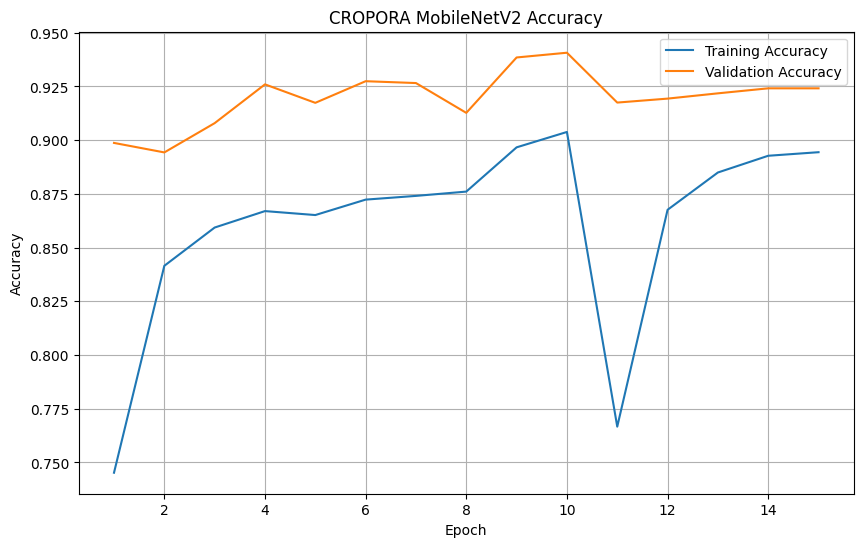

In [ ]:
# Step 28: Combine training histories

import matplotlib.pyplot as plt

initial_acc = history_initial.history["accuracy"]
initial_val_acc = history_initial.history["val_accuracy"]

fine_acc = history_fine.history["accuracy"]
fine_val_acc = history_fine.history["val_accuracy"]

all_acc = initial_acc + fine_acc
all_val_acc = initial_val_acc + fine_val_acc

epochs_range = range(1, len(all_acc) + 1)

plt.figure(figsize=(10, 6))

plt.plot(
    epochs_range,
    all_acc,
    label="Training Accuracy"
)

plt.plot(
    epochs_range,
    all_val_acc,
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("CROPORA MobileNetV2 Accuracy")
plt.legend()
plt.grid(True)

plt.show()

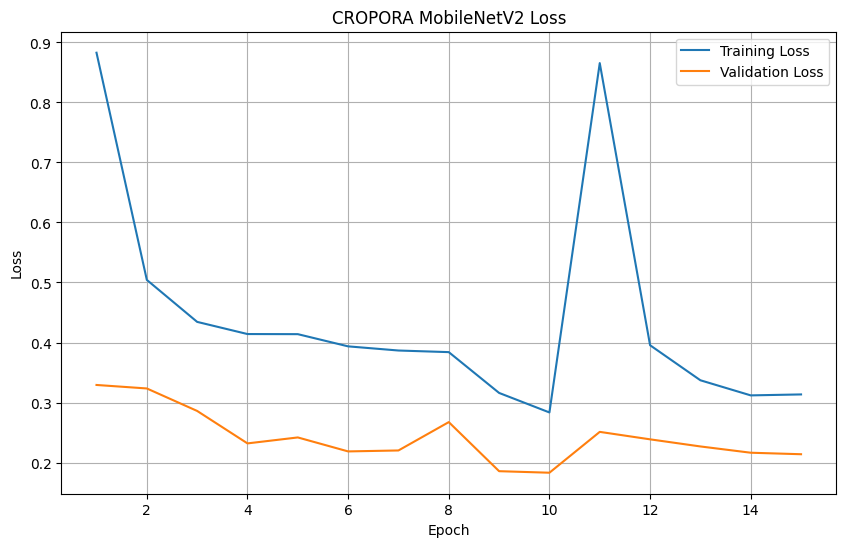

In [ ]:
# Step 29: Loss graph

initial_loss = history_initial.history["loss"]
initial_val_loss = history_initial.history["val_loss"]

fine_loss = history_fine.history["loss"]
fine_val_loss = history_fine.history["val_loss"]

all_loss = initial_loss + fine_loss
all_val_loss = initial_val_loss + fine_val_loss

plt.figure(figsize=(10, 6))

plt.plot(
    epochs_range,
    all_loss,
    label="Training Loss"
)

plt.plot(
    epochs_range,
    all_val_loss,
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("CROPORA MobileNetV2 Loss")
plt.legend()
plt.grid(True)

plt.show()

In [ ]:
# Step 30: Generate test predictions

import numpy as np

y_true = []
y_pred = []

for images_batch, labels_batch in test_ds:

    predictions = model.predict(
        images_batch,
        verbose=0
    )

    predicted_classes = np.argmax(
        predictions,
        axis=1
    )

    y_true.extend(
        labels_batch.numpy()
    )

    y_pred.extend(
        predicted_classes
    )

y_true = np.array(y_true)
y_pred = np.array(y_pred)

print("True labels:", y_true.shape)
print("Predicted labels:", y_pred.shape)

True labels: (8146,)
Predicted labels: (8146,)


In [ ]:
# Step 31: Classification report

from sklearn.metrics import classification_report

report = classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    digits=4
)

print(report)

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab     0.8416    0.9043    0.8718        94
                                 Apple___Black_rot     0.9184    0.9677    0.9424        93
                          Apple___Cedar_apple_rust     0.8200    1.0000    0.9011        41
                                   Apple___healthy     0.9602    0.9797    0.9698       246
                               Blueberry___healthy     0.9908    0.9513    0.9707       226
          Cherry_(including_sour)___Powdery_mildew     0.9935    0.9620    0.9775       158
                 Cherry_(including_sour)___healthy     0.9697    1.0000    0.9846       128
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot     0.8873    0.8182    0.8514        77
                       Corn_(maize)___Common_rust_     1.0000    0.9553    0.9771       179
               Corn_(maize)___Northern_Leaf_Blight     0.8704    0.9592    0.91

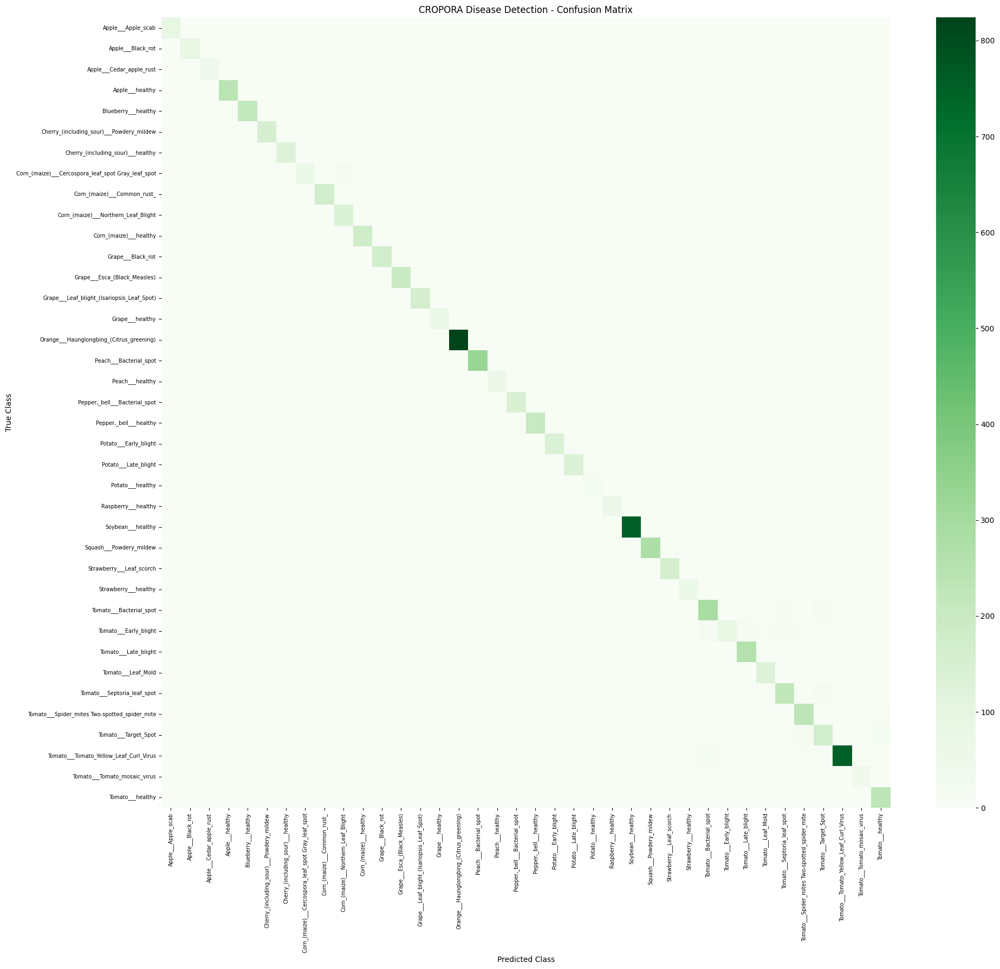

In [ ]:
# Step 32: Confusion matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(20, 18))

sns.heatmap(
    cm,
    annot=False,
    cmap="Greens",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("CROPORA Disease Detection - Confusion Matrix")

plt.xticks(
    rotation=90,
    fontsize=7
)

plt.yticks(
    rotation=0,
    fontsize=7
)

plt.tight_layout()
plt.show()

In [ ]:
# Step 33: Identify difficult classes

from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(
    y_true,
    y_pred,
    labels=np.arange(len(class_names)),
    zero_division=0
)

results_df = pd.DataFrame({
    "Class": class_names,
    "Precision": precision,
    "Recall": recall,
    "F1_Score": f1,
    "Support": support
})

results_df = results_df.sort_values(
    "F1_Score"
)

print(results_df.to_string(index=False))

                                             Class  Precision   Recall  F1_Score  Support
                             Tomato___Early_blight   0.877551 0.573333  0.693548      150
                                  Potato___healthy   0.588235 0.869565  0.701754       23
                              Tomato___Target_Spot   0.746667 0.796209  0.770642      211
                                Tomato___Leaf_Mold   0.760479 0.888112  0.819355      143
                       Tomato___Septoria_leaf_spot   0.842912 0.830189  0.836502      265
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot   0.887324 0.818182  0.851351       77
                                Apple___Apple_scab   0.841584 0.904255  0.871795       94
     Tomato___Spider_mites Two-spotted_spider_mite   0.833935 0.916667  0.873346      252
                      Tomato___Tomato_mosaic_virus   0.957447 0.803571  0.873786       56
                           Tomato___Bacterial_spot   0.858006 0.890282  0.873846      319
          

In [ ]:
print("Top 10 difficult classes:")

display(
    results_df.head(10)
)

Top 10 difficult classes:


,Class,Precision,Recall,F1_Score,Support
29,Tomato___Early_blight,0.877551,0.573333,0.693548,150
22,Potato___healthy,0.588235,0.869565,0.701754,23
34,Tomato___Target_Spot,0.746667,0.796209,0.770642,211
31,Tomato___Leaf_Mold,0.760479,0.888112,0.819355,143
32,Tomato___Septoria_leaf_spot,0.842912,0.830189,0.836502,265
7,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.887324,0.818182,0.851351,77
0,Apple___Apple_scab,0.841584,0.904255,0.871795,94
33,Tomato___Spider_mites Two-spotted_spider_mite,0.833935,0.916667,0.873346,252
36,Tomato___Tomato_mosaic_virus,0.957447,0.803571,0.873786,56
28,Tomato___Bacterial_spot,0.858006,0.890282,0.873846,319


In [ ]:
# Step 34: Save class names

import json

class_names_path = "/content/CROPORA_disease_classes.json"

with open(class_names_path, "w") as f:
    json.dump(
        class_names,
        f,
        indent=4
    )

print("Saved:", class_names_path)

Saved: /content/CROPORA_disease_classes.json


In [ ]:
# Step 35: Save final disease model

final_model_path = "/content/CROPORA_disease_model.keras"

model.save(final_model_path)

print("Model saved successfully:")
print(final_model_path)

Model saved successfully:
/content/CROPORA_disease_model.keras


In [ ]:
# Step 36: Single image prediction

from tensorflow.keras.utils import load_img, img_to_array

def predict_disease(image_path, model, class_names):

    # Load image
    image = load_img(
        image_path,
        target_size=(224, 224)
    )

    # Convert to array
    image_array = img_to_array(image)

    # Add batch dimension
    image_array = np.expand_dims(
        image_array,
        axis=0
    )

    # MobileNetV2 preprocessing
    image_array = preprocess_input(
        image_array
    )

    # Prediction
    predictions = model.predict(
        image_array,
        verbose=0
    )[0]

    # Best prediction
    predicted_index = np.argmax(predictions)

    predicted_class = class_names[
        predicted_index
    ]

    confidence = predictions[
        predicted_index
    ]

    return predicted_class, confidence

In [ ]:
# Pick a test image
test_image_path = test_df.iloc[0]["filepath"]

predicted_class, confidence = predict_disease(
    test_image_path,
    model,
    class_names
)

print("Image:", test_image_path)
print()
print("Predicted disease:", predicted_class)
print(f"Confidence: {confidence * 100:.2f}%")

Image: /kaggle/input/plantvillage/PlantVillage/train/Tomato___Late_blight/d61d71af-a2aa-442b-9dd4-37cf1f86e4c5___RS_Late.B 5609.JPG

Predicted disease: Tomato___Bacterial_spot
Confidence: 77.58%


In [ ]:
# Step 37: Save final CROPORA disease model

import os
import json

MODEL_PATH = "/content/CROPORA_disease_model.keras"
CLASSES_PATH = "/content/CROPORA_disease_classes.json"

# Save model
model.save(MODEL_PATH)

# Save class names
with open(CLASSES_PATH, "w") as f:
    json.dump(class_names, f, indent=4)

print("✅ Disease model saved:")
print(MODEL_PATH)

print("\n✅ Class names saved:")
print(CLASSES_PATH)

print("\nModel size:")
print(f"{os.path.getsize(MODEL_PATH) / (1024**2):.2f} MB")

✅ Disease model saved:
/content/CROPORA_disease_model.keras

✅ Class names saved:
/content/CROPORA_disease_classes.json

Model size:
13.05 MB


In [ ]:
# Step 38: Download model files

from google.colab import files

files.download("/content/CROPORA_disease_model.keras")
files.download("/content/CROPORA_disease_classes.json")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>